<a href="https://colab.research.google.com/github/shinebalance/DL_notes/blob/master/DeepLearningwithPython/5_0_DL_with_CNN(tf2_0).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **TF2.0学習**  
---

## 【目的】
* 以下書籍,第５章の整理内容をTF2.0のsubclassingで整理して学習するnotebook  

<div align="center">
<img src="https://book.mynavi.jp/files/topics/90124_ext_06_0.jpg" frameborder="0" width="110" height="125" scrolling="yes"></img></div>  
https://book.mynavi.jp/ec/products/detail/id=90124  

## 【お品書き】
 1. CNNのしくみ(5.1)  
 2. 実践CNN,前処理とDataAugmentation(5.2)  
 3. 実践転移学習〜特徴抽出&ファインチューニング〜(5.3)  
 4. フィルタ可視化(5.4.4~)  

* edited by @shinebalance  
> 元ネタは基本こちら  
> https://github.com/fchollet/deep-learning-with-python-notebooks

> 今回追加で参考にしたもの  
> https://note.nkmk.me/python-tensorflow-keras-basics/

---


# Kerasのインポート

In [0]:
# import keras
# keras.__version__#2.2.4で実行@shinebalance
import tensorflow as tf
from tensorflow import keras
keras.__version__

# enable eager execution
tf.enable_eager_execution()
print(tf.executing_eagerly())

True


---

# 1)CNNのしくみ

## MNIST分類を行うシンプルなCNNモデル
## を、Functional APIで実装する

In [0]:
inputs = tf.keras.Input(shape=(28, 28, 1))

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
outputs = tf.keras.layers.Dense(10, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

'''
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())#FlattenよりもGlobalAveragePool2D()がいいらしい
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))#分類なので最後はrelu+Softmax
'''

# モデル形状の確認
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          36928     
______________________________________________

## 更に、Subclassing APIで実装する

In [0]:
# Subclassing API
class SimpleCNN_sc(tf.keras.Model):
    def __init__(self):
        super(SimpleCNN_sc, self).__init__()
        self.cn1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')
        self.max1 = tf.keras.layers.MaxPooling2D((2, 2))
        self.cn2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')
        self.max2 = tf.keras.layers.MaxPooling2D((2, 2))
        self.cn3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(64, activation='relu')
        self.dense2 = tf.keras.layers.Dense(10, activation='softmax')

    def call(self, x, training=False):
        x = self.cn1(x)
        x = self.max1(x)
        x = self.cn2(x)
        x = self.max2(x)
        x = self.cn3(x)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        return x

model = SimpleCNN_sc()
model.build((None, 28, 28, 1))

'''
inputs = tf.keras.Input(shape=(28, 28, 1))

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
outputs = tf.keras.layers.Dense(10, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
'''


# モデル形状の確認
model.summary()

Model: "simple_cnn_sc"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
conv2d_1 (Conv2D)            multiple                  18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 multiple                  0         
_________________________________________________________________
conv2d_2 (Conv2D)            multiple                  36928     
_________________________________________________________________
flatten (Flatten)            multiple                  0         
_________________________________________________________________
dense (Dense)                multiple                

## 前処理を実施してモデルの訓練を実施  
## を、model.fit()ではなく自力で回す

> memo  
> tutorialだとone-hot encoding せずにsparse categorical entropyを使ってる  
> https://www.tensorflow.org/tutorials/quickstart/advanced?hl=ja

In [0]:
from keras.datasets import mnist
from keras.utils import to_categorical

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

# 28*28に成形して正規化
train_images = train_images.reshape((60000, 28, 28, 1))
train_images = train_images.astype('float32') / 255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype('float32') / 255

# カテゴリ値に変更
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

'''
# all keras
# オプティマイザ, 損失関数, メトリックを決めて学習実行
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_images, train_labels, epochs=5, batch_size=64)
'''

# Optimizer
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001)
# loss function
loss_fn = tf.keras.losses.categorical_crossentropy
# metric
# need ()
metrics_acc = tf.keras.metrics.Accuracy()
#metrics_acc = tf.keras.metrics.CategoricalCrossentropy()

# set status
epochs = 3
batch_size = 64

print(train_images.shape)
print(test_images.shape)

# tf.Data
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size)
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_labels))
test_dataset = test_dataset.batch(64)

(60000, 28, 28, 1)
(10000, 28, 28, 1)


In [0]:
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()
print(train_labels)

[5 0 4 ... 5 6 8]


In [0]:
# Iterate
for epoch in range(epochs):
  print('Start of epoch %d' % (epoch+1,))

  # Inside epoch(per batch size)
  for step, (train_images, train_labels) in enumerate(train_dataset):
    with tf.GradientTape() as tape:
      _y = model(train_images)
      # loss
      loss = loss_fn(train_labels, _y)
      loss += sum(model.losses)  # pile up loss

    # compute grads
    grads = tape.gradient(loss, model.trainable_weights)
    optimizer.apply_gradients(zip(grads, model.trainable_weights))
    #print(train_labels[step])
    #print(_y[step])
    metrics_acc(train_labels, _y)

    if step % 300 == 0:
      #print('step %s: mean loss = %s' % (step, metrics_acc.result()))
      template = 'Step {}, metrics_acc: {}'
      print(template.format(step, metrics_acc.result() * 100))
    
    metrics_acc.reset_states()

Start of epoch 1
Step 0, metrics_acc: 50.3125
Step 300, metrics_acc: 58.125
Step 600, metrics_acc: 52.03125
Step 900, metrics_acc: 62.03125
Start of epoch 2
Step 0, metrics_acc: 55.9375
Step 300, metrics_acc: 65.625
Step 600, metrics_acc: 60.15625
Step 900, metrics_acc: 67.03125
Start of epoch 3
Step 0, metrics_acc: 64.84375
Step 300, metrics_acc: 70.15625
Step 600, metrics_acc: 66.40625
Step 900, metrics_acc: 71.5625


### 検証データの精度を確認

In [0]:
test_metrics_acc = tf.keras.metrics.Accuracy()

# Run a validation loop at the end of each epoch.
for test_images, test_labels in test_dataset:
  _y_pred = model(test_images)
  test_metrics_acc(test_labels, _y_pred)

val_acc = test_metrics_acc.result()
test_metrics_acc.reset_states()
print('Validation acc: %s' % (float(val_acc),))

Validation acc: 0.6905500292778015


> While our densely-connected network from Chapter 2 had a test accuracy of 97.8%, our basic convnet has a test accuracy of 99.3%: we decreased our error rate by 68% (relative). Not bad! 

全結合器が97.8%なので、その値超える結果なら上々だね！ by Francois

### [補記]  
お時間あればConv2D層の数を変えて結果を見てみましょう

*一例*  
```python:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
#　追加
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

model.add(layers.Flatten())#FlattenよりもGlobalAveragePool2D()がいいらしい
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))#分類なので最後はrelu+Softmax
# モデル形状の確認
model.summary()
```

---

# 2) 実践CNN,前処理とDataAugmentation(5.2)  

## 使用データの準備
https://www.kaggle.com/c/dogs-vs-cats/data
* Kaggleアカウントが必要。Download allで取得可  

### URLから利用データをDL可能だが、学習にマシンパワーを要するため、後述の要領でGoogle ColabとKaggle アカウントを連携する手順を推奨する。  


### (参考)ローカル実行の場合  
取得したZipファイル名は日本語書籍と完全イコールの状態ではないので、調整が必要  
解凍すると"sampleSubmission.csv", "test1.zip", "train.zip"が含まれており、
本notebook１では次のようなツリーとなるようそれぞれ解凍  
> --[Current Directory]  
> ---L[dogs-vs-cats]  
> -----L[test1]  
> -----L[train]  

---  
### GoogleColabとKaggleアカウントの連携とDatasetの取得
#### URL
https://qiita.com/katsu1110/items/a8d508a1b6f07bd3a243
#### 連携の手順
 * KaggleアカウントよりAPI tokenを入手
 * 以下を実行。「ファイル選択」ボタンが出たら押下してkaggle.jsonをアップロード  
   (自身のKaggleアカウントに紐付いているので取り扱い注意)
 * この方法で取得したデータセットはセッションが終了すると消えるので、  
   基本このセクションは毎回実行が必要

In [0]:
from google.colab import files
files.upload()#初回は「ファイル選択」が実行できずエラーになることが有るので、何度か実行してみること

In [0]:
# ディレクトリ状況確認
!ls

kaggle.json  sample_data


In [0]:
# Kaggleデータセット保管用のディレクトリを作成
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
# Kaggleモジュールをinstall
!pip install kaggle

In [0]:
# アクセスパーミッション付加
!chmod 600 /root/.kaggle/kaggle.json

# 今回のcatVSdogデータセットを取得(URL:https://www.kaggle.com/c/dogs-vs-cats/discussion)
# 稀に404エラーが出る場合があり、その場合はセッションごと再起動が推奨
!kaggle competitions download -c dogs-vs-cats

  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 35.5MB/s]
100% 270M/271M [00:01<00:00, 152MB/s]
100% 271M/271M [00:01<00:00, 160MB/s]
 99% 539M/543M [00:03<00:00, 158MB/s]
100% 543M/543M [00:03<00:00, 163MB/s]


In [0]:
# zipの解凍
# 大量行のログが出るので完了後は出力エリアを縮小することを推奨
!unzip -o train.zip -d ./dogs-vs-cats

Archive:  train.zip
   creating: ./dogs-vs-cats/train/
  inflating: ./dogs-vs-cats/train/cat.0.jpg  
  inflating: ./dogs-vs-cats/train/cat.1.jpg  
  inflating: ./dogs-vs-cats/train/cat.10.jpg  
  inflating: ./dogs-vs-cats/train/cat.100.jpg  
  inflating: ./dogs-vs-cats/train/cat.1000.jpg  
  inflating: ./dogs-vs-cats/train/cat.10000.jpg  
  inflating: ./dogs-vs-cats/train/cat.10001.jpg  
  inflating: ./dogs-vs-cats/train/cat.10002.jpg  
  inflating: ./dogs-vs-cats/train/cat.10003.jpg  
  inflating: ./dogs-vs-cats/train/cat.10004.jpg  
  inflating: ./dogs-vs-cats/train/cat.10005.jpg  
  inflating: ./dogs-vs-cats/train/cat.10006.jpg  
  inflating: ./dogs-vs-cats/train/cat.10007.jpg  
  inflating: ./dogs-vs-cats/train/cat.10008.jpg  
  inflating: ./dogs-vs-cats/train/cat.10009.jpg  
  inflating: ./dogs-vs-cats/train/cat.1001.jpg  
  inflating: ./dogs-vs-cats/train/cat.10010.jpg  
  inflating: ./dogs-vs-cats/train/cat.10011.jpg  
  inflating: ./dogs-vs-cats/train/cat.10012.jpg  
  inflatin

In [0]:
# 解凍結果の確認
!ls ./dogs-vs-cats/train | head -10

cat.0.jpg
cat.10000.jpg
cat.10001.jpg
cat.10002.jpg
cat.10003.jpg
cat.10004.jpg
cat.10005.jpg
cat.10006.jpg
cat.10007.jpg
cat.10008.jpg




以上

---

## Dog vs Cat Datasetを使ったCNNの検証(以後同じデータセットを使う学習で共通)

### データセットの設定

In [0]:
import os, shutil

# ディレクトリの指定 @shinebalance
original_dataset_dir = './dogs-vs-cats/train'
base_dir = './cats_and_dogs_small'

# original @Francois
# original_dataset_dir = '/Users/fchollet/Downloads/kaggle_original_data'
# base_dir = '/Users/fchollet/Downloads/cats_and_dogs_small'

os.mkdir(base_dir)

In [0]:
# DLしたデータをリネームしてフォルダ分けする

# Directories for our training,
# validation and test splits
train_dir = os.path.join(base_dir, 'train')
os.mkdir(train_dir)
validation_dir = os.path.join(base_dir, 'validation')
os.mkdir(validation_dir)
test_dir = os.path.join(base_dir, 'test')
os.mkdir(test_dir)

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
os.mkdir(train_cats_dir)

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
os.mkdir(train_dogs_dir)

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
os.mkdir(validation_cats_dir)

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
os.mkdir(validation_dogs_dir)

# Directory with our validation cat pictures
test_cats_dir = os.path.join(test_dir, 'cats')
os.mkdir(test_cats_dir)

# Directory with our validation dog pictures
test_dogs_dir = os.path.join(test_dir, 'dogs')
os.mkdir(test_dogs_dir)

# Copy first 1000 cat images to train_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_cats_dir, fname)
    shutil.copyfile(src, dst)

# Copy next 500 cat images to validation_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(validation_cats_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 cat images to test_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_cats_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy first 1000 dog images to train_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_dogs_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 dog images to validation_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(validation_dogs_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 dog images to test_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_dogs_dir, fname)
    shutil.copyfile(src, dst)

In [0]:
# データ件数の確認
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))
print('total test cat images:', len(os.listdir(test_cats_dir)))
print('total test dog images:', len(os.listdir(test_dogs_dir)))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
total test cat images: 500
total test dog images: 500


### 2-1)モデル構築(転移学習なし)
* CNNをデータセットで１から学習させるパターン

In [0]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 128)       147584    
__________

In [0]:
from keras import optimizers

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

W0815 23:53:09.610758 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0815 23:53:09.621171 139908707583872 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


#### データ前処理

In [0]:
# リサイズ処理
from keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [0]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (20, 150, 150, 3)
labels batch shape: (20,)


#### 学習（転移学習なし）

In [0]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50)

W0812 14:23:50.009128 140513819547520 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Epoch 1/30
100/100 [==============================] - 17s 171ms/step - loss: 0.6890 - acc: 0.5475 - val_loss: 0.6654 - val_acc: 0.5950
Epoch 2/30
100/100 [==============================] - 8s 83ms/step - loss: 0.6555 - acc: 0.5995 - val_loss: 0.6382 - val_acc: 0.6400
Epoch 3/30
100/100 [==============================] - 8s 84ms/step - loss: 0.6101 - acc: 0.6720 - val_loss: 0.6279 - val_acc: 0.6350
Epoch 4/30
100/100 [==============================] - 8s 84ms/step - loss: 0.5724 - acc: 0.6980 - val_loss: 0.6170 - val_acc: 0.6500
Epoch 5/30
100/100 [==============================] - 8s 85ms/step - loss: 0.5463 - acc: 0.7215 - val_loss: 0.6224 - val_acc: 0.6480
Epoch 6/30
100/100 [==============================] - 8s 84ms/step - loss: 0.5132 - acc: 0.7425 - val_loss: 0.5793 - val_acc: 0.6950
Epoch 7/30
100/100 [==============================] - 9s 85ms/step - loss: 0.4917 - acc: 0.7495 - val_loss: 0.5994 - val_acc: 0.6810
Epoch 8/30
100/100 [==============================] - 8s 84ms/step 

#### 実行時間についてのメモ(@shinebalance)
* MacBookPro2016(Core i5 2.9Ghz) 　：5エポックで10分
* Google Colab with GPU　　　　　　：5エポックで1分


In [0]:
model.save('cats_and_dogs_small_1.h5')

#### 可視化

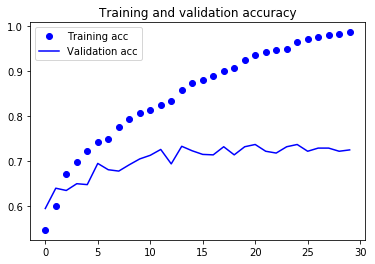

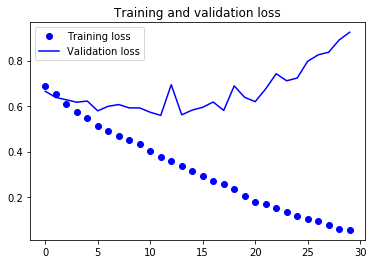

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### 2-2)Data Augmentation（データ拡張）後のモデル構築

In [0]:
# 2-1)をスキップしている場合は以下コメントイン
# from keras.preprocessing.image import ImageDataGenerator
# import matplotlib.pyplot as plt

datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

#### Data Augmentationの実行

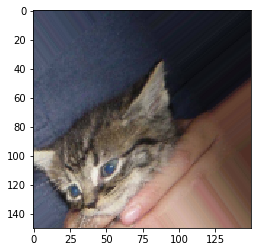

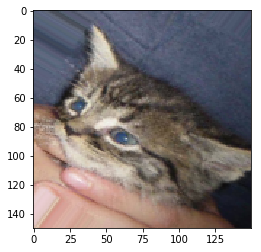

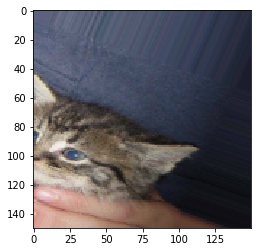

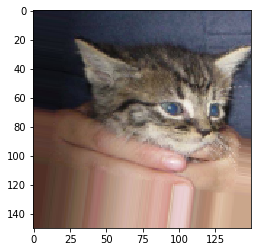

In [0]:
# This is module with image preprocessing utilities
from keras.preprocessing import image

fnames = [os.path.join(train_cats_dir, fname) for fname in os.listdir(train_cats_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(150, 150))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

#### モデル構築(ドロップアウト層を含む）

In [0]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

W0815 23:53:51.336394 139908707583872 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)       147584    
__________

#### 学習
* **!本学習はデータ件数が多く、Google Colab(withGPU)でも1時間近く学習に時間がかかるため、自宅での実行を推奨する**

In [0]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/100
100/100 [==============================] - 28s 282ms/step - loss: 0.6901 - acc: 0.5147 - val_loss: 0.6724 - val_acc: 0.6244
Epoch 2/100
100/100 [==============================] - 24s 239ms/step - loss: 0.6741 - acc: 0.5672 - val_loss: 0.6746 - val_acc: 0.5464
Epoch 3/100
100/100 [==============================] - 24s 236ms/step - loss: 0.6493 - acc: 0.6062 - val_loss: 0.6259 - val_acc: 0.6377
Epoch 4/100
100/100 [==============================] - 24s 240ms/step - loss: 0.6330 - acc: 0.6353 - val_loss: 0.6310 - val_acc: 0.6482
Epoch 5/100
100/100 [==============================] - 24s 237ms/step - loss: 0.6241 - acc: 0.6469 - val_loss: 0.6091 - val_acc: 0.6504
Epoch 6/100
100/100 [==============================] - 24s 236ms/step - loss: 0.6027 - acc: 0.6762 - val_loss: 0.5722 - val_acc: 0.7049
Epoch 7/100
100/100 [==============================] - 24s 239ms/step - loss: 0.5932 - acc: 0.6828 -

#### 可視化

In [0]:
model.save('cats_and_dogs_small_2.h5')

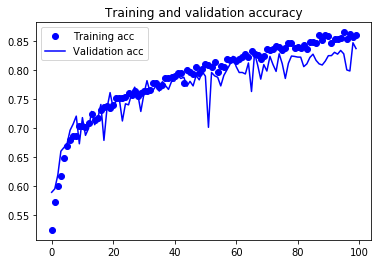

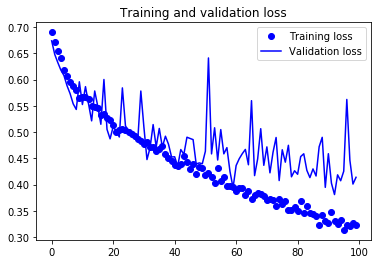

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# 3)実践転移学習〜特徴抽出&ファインチューニング〜

## 3-1)特徴抽出

Francoisの画像より
<img src="https://s3.amazonaws.com/book.keras.io/img/ch5/swapping_fc_classifier.png" width=50%>


今回はVGG-16モデルを学習済モデルとして利用する。

### VGG-16モデルの取得

In [0]:
# ベースモデルの読み込み
from keras.applications import VGG16

#imagenetで学習済の重みで,出力側の分類機を含まない
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

W0815 23:50:55.348543 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0815 23:50:55.405035 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0815 23:50:55.420956 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0815 23:50:55.464194 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



58892288/58889256 [==============================] - 1s 0us/step


W0815 23:50:57.002154 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0815 23:50:57.003250 139908707583872 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



In [0]:
# モデル構成の確認
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

↑完成形のCNNであれば付属する、最後のDense＋Softmaxの分類層が存在しない。

特徴抽出を行う場合は以下2種類の手法が有る。
 1. 利用したいデータを学習済モデルに通して出力された特徴量をインプットにして、全く別の全結合層＋分類のNWを作る。
 2. 全結合層+分類器を↑のようなCNNの最後に追加して、そのCNNで処理を行う。

* @shinebalanceのメモ  
本書p153にて、手法1ではDataAugmentationが利用できないと有るが、利用できない理由がわからない。学習によるパラメータの更新ではなく特徴量の抽出なので、Augmentationしたデータでは元画像が同じなら同じ特徴量が抽出されてしまう・・・・・・ということなのか？一緒では？


### 3-1-2)特徴抽出①

In [0]:
''' # @Francoisのコード、上部の処理を実施済であれば実行不要のためコメントアウト
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

base_dir = '/Users/fchollet/Downloads/cats_and_dogs_small'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')
'''

# 以下、GoogleColab with TPUで10分程度かかった
import numpy as np

datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 4, 4, 512))
    labels = np.zeros(shape=(sample_count))
    generator = datagen.flow_from_directory(
        directory,
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode='binary')
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        features[i * batch_size : (i + 1) * batch_size] = features_batch
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch
        i += 1
        if i * batch_size >= sample_count:
            # Note that since generators yield data indefinitely in a loop,
            # we must `break` after every image has been seen once.
            break
    return features, labels

train_features, train_labels = extract_features(train_dir, 2000)
validation_features, validation_labels = extract_features(validation_dir, 1000)
test_features, test_labels = extract_features(test_dir, 1000)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


取得した特徴量をflattenする

In [0]:
train_features = np.reshape(train_features, (2000, 4 * 4 * 512))
validation_features = np.reshape(validation_features, (1000, 4 * 4 * 512))
test_features = np.reshape(test_features, (1000, 4 * 4 * 512))

#### 全結合層+分類器のみのシンプルなモデルを作成して学習を実施

In [0]:
from keras import models
from keras import layers
from keras import optimizers

model = models.Sequential()
model.add(layers.Dense(256, activation='relu', input_dim=4 * 4 * 512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

# 3層(正則化のドロップアウト含む)のシンプルなモデルであることを確認
model.summary()

W0815 02:17:25.066495 140018954446720 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
W0815 02:17:25.114091 140018954446720 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0815 02:17:25.127513 140018954446720 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 2,097,665
Trainable params: 2,097,665
Non-trainable params: 0
_________________________________________________________________


学習処理の実行
* memo
  * Google Colab with TPU で3分程度
  

In [0]:
history = model.fit(train_features, train_labels,
                    epochs=30,
                    batch_size=20,
                    validation_data=(validation_features, validation_labels))

可視化

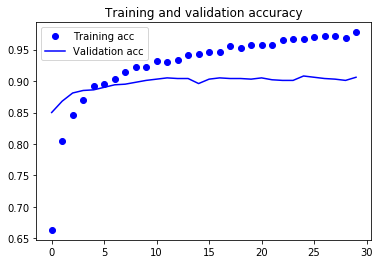

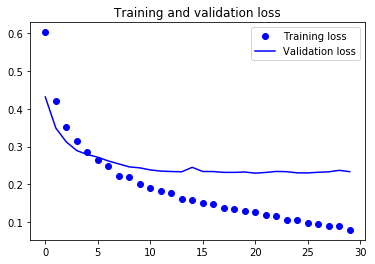

In [0]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### 3-1-2)特徴抽出②
 * DataAugmentation可能な特徴抽出の実行

#### モデル構成

In [0]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


VGG16モデルに全結合層＋分類器を足している様子。  
model.addだけで組み立てできている。

In [0]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights before freezing the conv base: 30


この時点でのtrainable weights（凍結されていないパラメータ）は３０

In [0]:
# trainableの変更,compile前でないと有効にならない
conv_base.trainable = False
print('This is the number of trainable weights '
      'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


trainable weightが４となる。

#### **@shinebalance memo**  
この辺キムさんの言ってたとおり図解がないとわからない・・・

#### DataAugmentation+モデル学習

* memo
 * Google Colab with TPU 11:35~

In [0]:
#'''
from keras import models
from keras import layers
from keras import optimizers
#'''
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-5),
              metrics=['acc'])

W0815 07:00:11.075016 140114739148672 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0815 07:00:11.086497 140114739148672 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [0]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

Epoch 1/30
 - 22s - loss: 0.5995 - acc: 0.6805 - val_loss: 0.4758 - val_acc: 0.7880
Epoch 2/30
 - 17s - loss: 0.4775 - acc: 0.7835 - val_loss: 0.3777 - val_acc: 0.8490
Epoch 3/30
 - 17s - loss: 0.4358 - acc: 0.8075 - val_loss: 0.3353 - val_acc: 0.8640
Epoch 4/30
 - 17s - loss: 0.4026 - acc: 0.8310 - val_loss: 0.3088 - val_acc: 0.8740
Epoch 5/30
 - 17s - loss: 0.4007 - acc: 0.8230 - val_loss: 0.2990 - val_acc: 0.8790
Epoch 6/30
 - 17s - loss: 0.3661 - acc: 0.8385 - val_loss: 0.2815 - val_acc: 0.8790
Epoch 7/30
 - 17s - loss: 0.3544 - acc: 0.8425 - val_loss: 0.2713 - val_acc: 0.8870
Epoch 8/30
 - 16s - loss: 0.3483 - acc: 0.8555 - val_loss: 0.2708 - val_acc: 0.8910
Epoch 9/30
 - 16s - loss: 0.3386 - acc: 0.8520 - val_loss: 0.2686 - val_acc: 0.8880
Epoch 10/30
 - 17s - loss: 0.3287 - acc: 0.8510 - val_loss: 0.2604 - val_acc: 0.8940
Epoch 11/30
 - 17s - loss: 0.3280 - acc: 0.8550 - val_loss: 0.2695 - val_acc: 0.8810
Epoch 12/30
 - 16s - loss: 0.3205 - acc: 0.8640 - val_loss: 0.2520 - val_a

* memo
 * 非GPUマシンでは完了しないので注意

In [0]:
# modelの保存
model.save('cats_and_dogs_small_3.h5')

#### 可視化

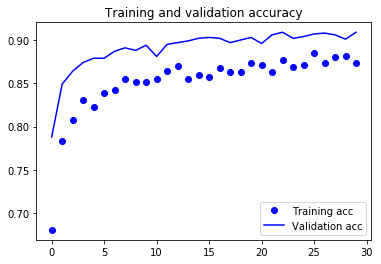

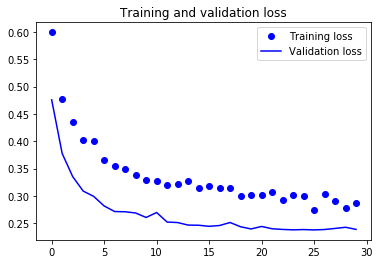

In [0]:
# import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## 3-2) ファインチューニング

Francoisの画像より
<img src="https://s3.amazonaws.com/book.keras.io/img/ch5/vgg16_fine_tuning.png" width=30%>



前項の特徴抽出においては、学習済モデルを利用して①特徴抽出した結果をもらって分類器を組む②分類機をまるごと自分の作ったものに取り替えて実行する、のアプローチで学習済モデルを利用してきた。  

ファインチューニングにおいては、分類機だけでなく、畳み込み層も一部解答して再学習を行う（画像内のConv block 5）。
ただし、分類器は今回の分類用途に合わせて、予め学習済の状態でなければならない。

<b><font color ='red'>→上記の理由により、本3-2項は3-1項を実行済の状態でなければならない。</font></b>

よって学習は以下の流れで行う。


1.  学習済のBaseNWの出力部分に新たな層を作る。  
(Add your custom network on top of an already trained base network.)
2.  BaseNWを凍結する。(Freeze the base network.)
3.  追加したそうの訓練を行う。(Train the part you added.)
4.  学習済BaseNWの層を一部解凍する。(Unfreeze some layers in the base network.)
5.  追加層と共に解凍したそうの学習を行う。(Jointly train both these layers and the part you added.)


In [0]:
#モデル全体の状態確認,分類部分の3層が有ればOK
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________


#### モデル構築

In [0]:
# VGG-16の高精細確認
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

In [0]:
# modelの設定確認
print('This is the number of trainable weights of conv_base:'
      , len(conv_base.trainable_weights))

This is the number of trainable weights of conv_base: 0


In [0]:
# VGG-16のモデル設定変更
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [0]:
# 変更された設定の確認
print('This is the number of trainable weights of conv_base:'
      , len(conv_base.trainable_weights))

This is the number of trainable weights of conv_base: 6


#### 学習

In [0]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['acc'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50)

Epoch 1/100
100/100 [==============================] - 20s 195ms/step - loss: 0.2981 - acc: 0.8790 - val_loss: 0.2260 - val_acc: 0.9080
Epoch 2/100
100/100 [==============================] - 18s 179ms/step - loss: 0.2663 - acc: 0.8810 - val_loss: 0.2031 - val_acc: 0.9260
Epoch 3/100
100/100 [==============================] - 18s 179ms/step - loss: 0.2174 - acc: 0.9055 - val_loss: 0.2340 - val_acc: 0.9100
Epoch 4/100
100/100 [==============================] - 18s 181ms/step - loss: 0.2149 - acc: 0.9120 - val_loss: 0.1899 - val_acc: 0.9240
Epoch 5/100
100/100 [==============================] - 18s 178ms/step - loss: 0.2064 - acc: 0.9170 - val_loss: 0.2073 - val_acc: 0.9230
Epoch 6/100
100/100 [==============================] - 18s 178ms/step - loss: 0.1904 - acc: 0.9145 - val_loss: 0.1940 - val_acc: 0.9330
Epoch 7/100
100/100 [==============================] - 18s 178ms/step - loss: 0.1843 - acc: 0.9305 - val_loss: 0.2004 - val_acc: 0.9280
Epoch 8/100
100/100 [===========================

* memo
 * Colab with GPU : 27分

In [0]:
# model保存
model.save('cats_and_dogs_small_4.h5')

#### 可視化

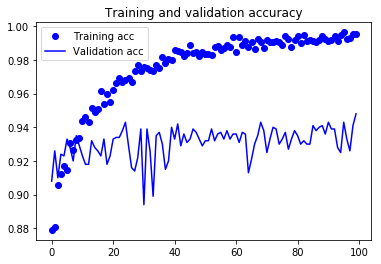

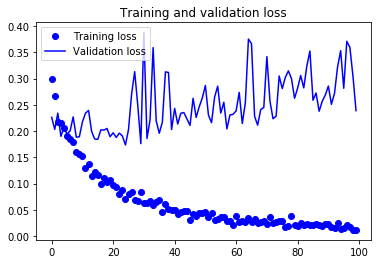

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

#### 可視化（ノイズ除去）

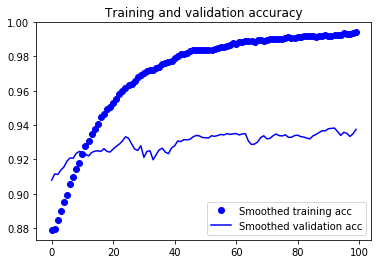

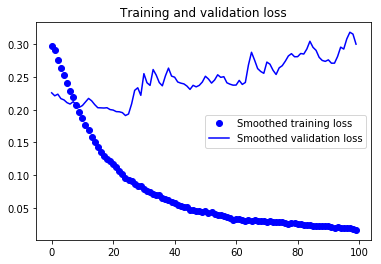

In [0]:
def smooth_curve(points, factor=0.8):
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(epochs,
         smooth_curve(acc), 'bo', label='Smoothed training acc')
plt.plot(epochs,
         smooth_curve(val_acc), 'b', label='Smoothed validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,
         smooth_curve(loss), 'bo', label='Smoothed training loss')
plt.plot(epochs,
         smooth_curve(val_loss), 'b', label='Smoothed validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

#### 検証

In [0]:
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

Found 1000 images belonging to 2 classes.
test acc: 0.9409999930858612


# 4)フィルタ可視化(5.4.4~) 

### 4-1)特徴マップの可視化  
* 実際にフィルタを通した後、どの部分が活性化しているのか

In [0]:
from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')
model.summary()  # As a reminder.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)       147584    
__________

In [0]:
#@francois
#img_path = '/Users/fchollet/Downloads/cats_and_dogs_small/test/cats/cat.1700.jpg'
# 敢えて違う画像でテスト
img_path = './cats_and_dogs_small/test/cats/cat.1707.jpg'

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


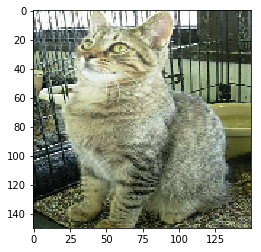

In [0]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

### 可視化
 * Modelクラスを利用して多入力多出力のModelを作成する  (詳しくは第7章)

In [0]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [0]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

In [0]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


In [0]:
# model summaryを見るとconv2d_5層と一致しているのが分かる
model.summary() 

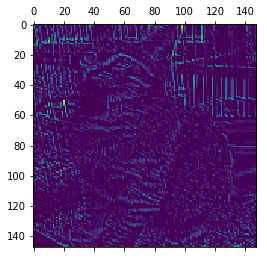

In [0]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis') #32のチャネルのうちチャネル3だけをカラーマップで表示している
plt.show()

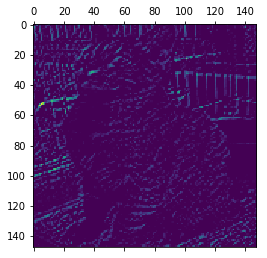

In [0]:
plt.matshow(first_layer_activation[0, :, :, 30], cmap='viridis')
plt.show()

残りのチャネルもすべて確認

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


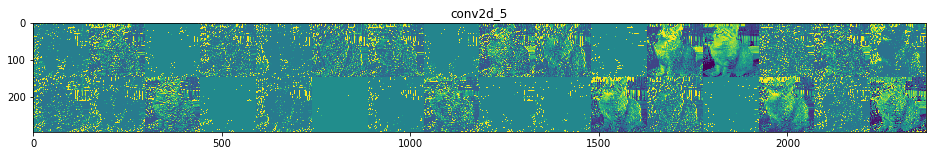

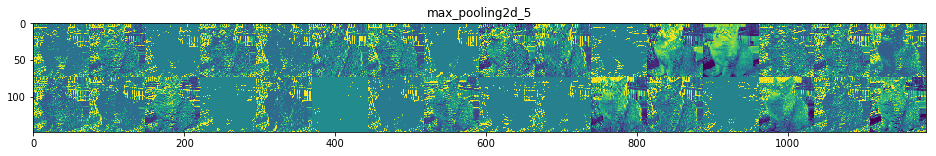

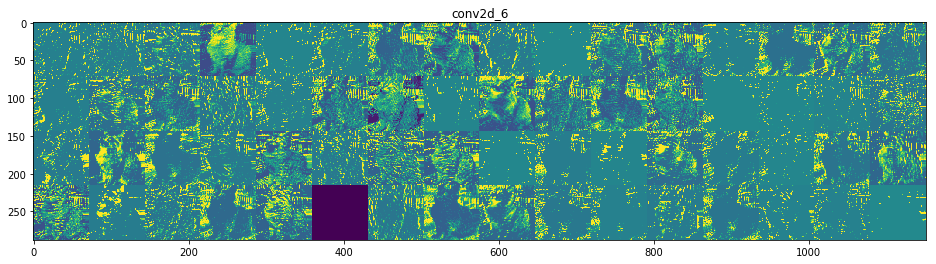

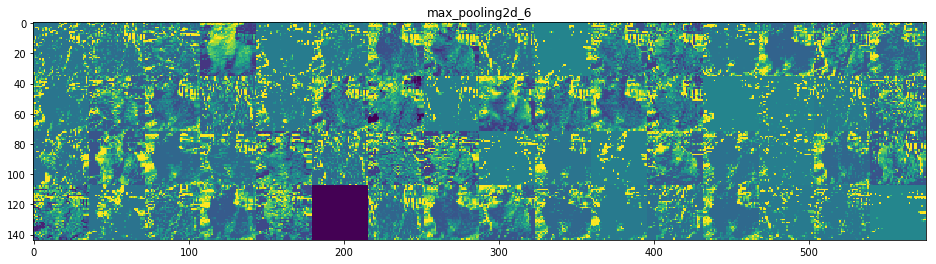

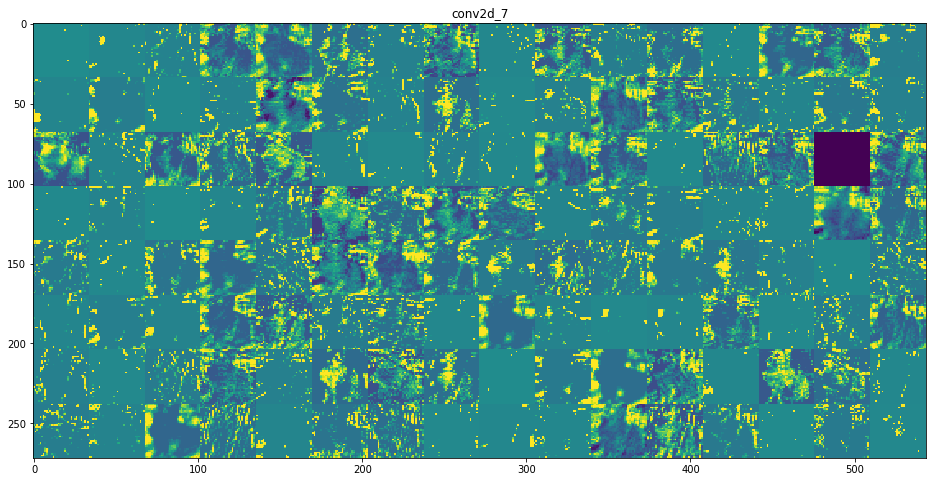

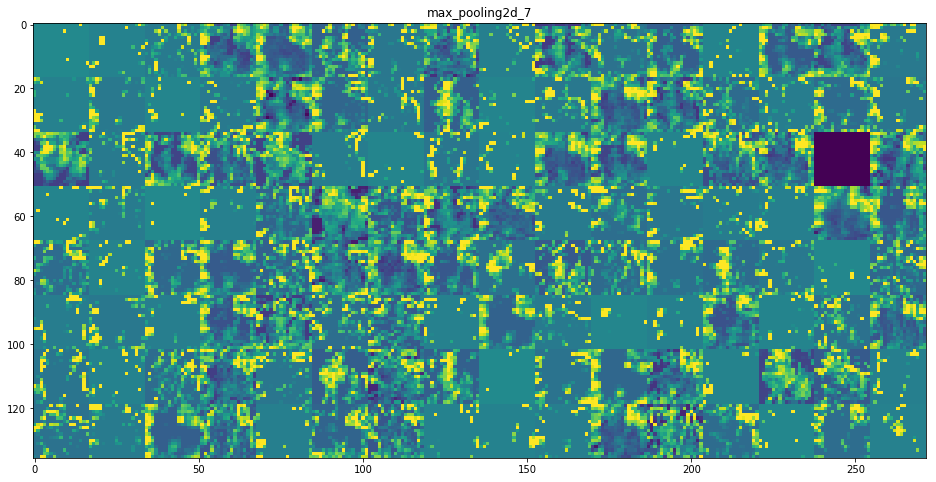

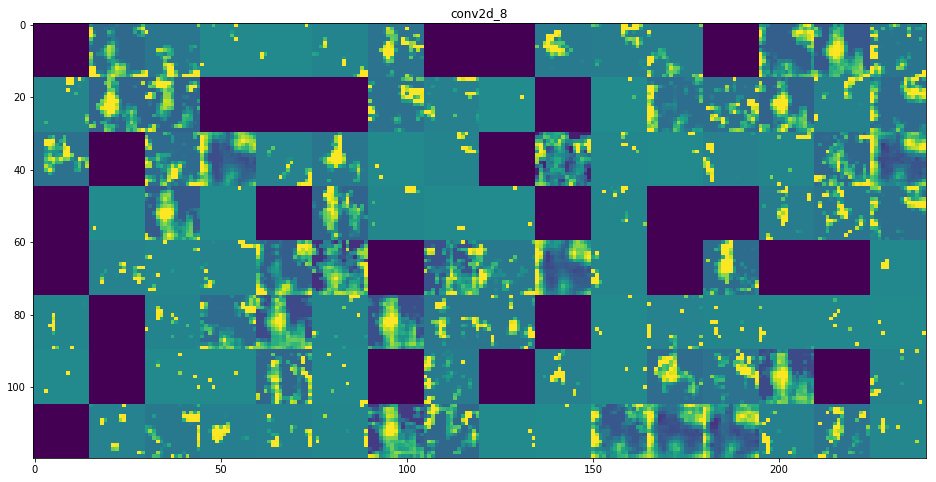

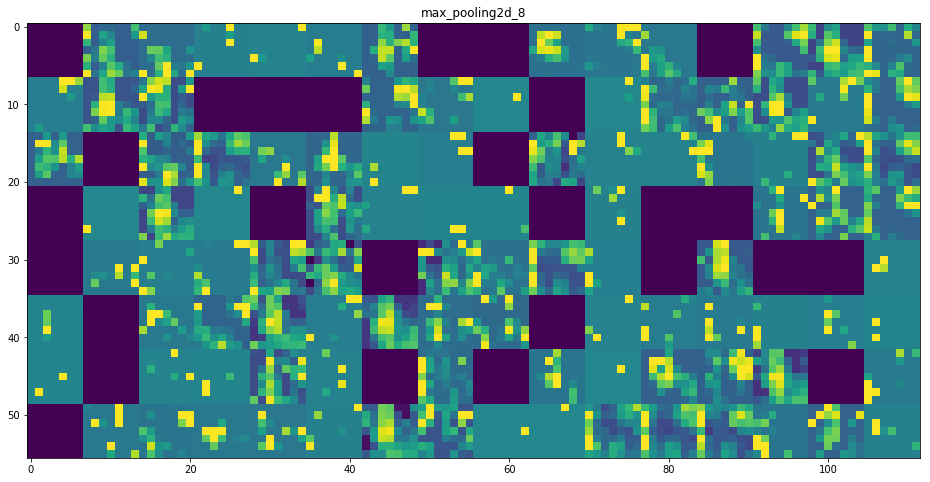

In [0]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

* 画像を変えて試してみるとまた面白い


* @shinebalance memo
 * 層が進むほど出てくるブランクは、クラス情報を持つフィルタに反応しなくななったということ、例えばこのケースだと「猫ではなく犬への分類につながるフィルタ」がブランクになっているという理解で良いのか
 * 人間の肌感覚との差でも有ると思うので難しいが、CNNが層を重ねて「抽象的な特徴量を捉えている」という様子が納得できるような納得できないような。
   * 例えば層の中で元画像っぽい感じを残している奴残していないやつがすでに混在しているのは何故だろう？
   * とは思う。
  


#### 他の画像もやってみよう
 * img_pathに渡す画像番号を変更することで他の画像を通した場合確認できる

(1, 150, 150, 3)


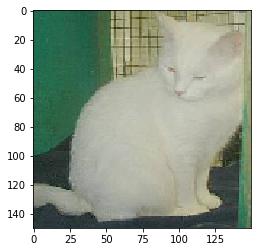

In [0]:
# 敢えて違う画像でテスト
img_path = './cats_and_dogs_small/test/cats/cat.1710.jpg'


img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


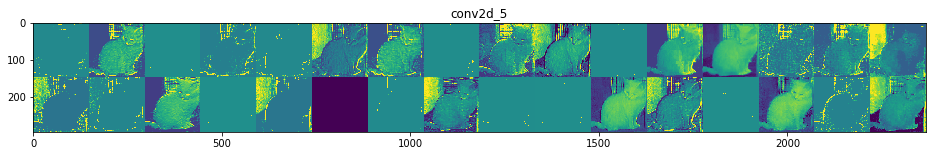

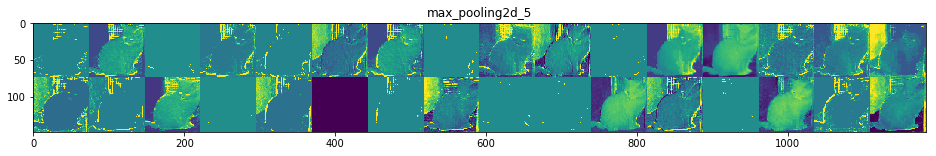

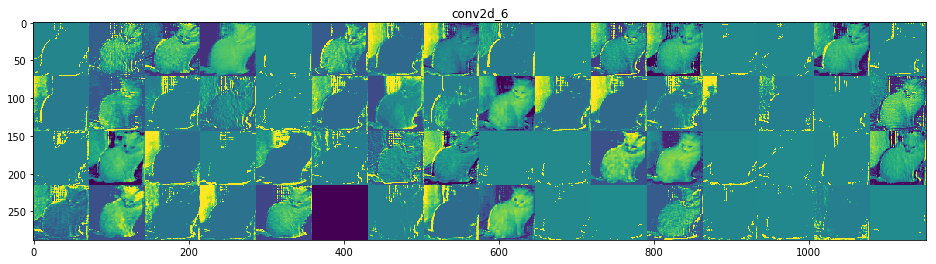

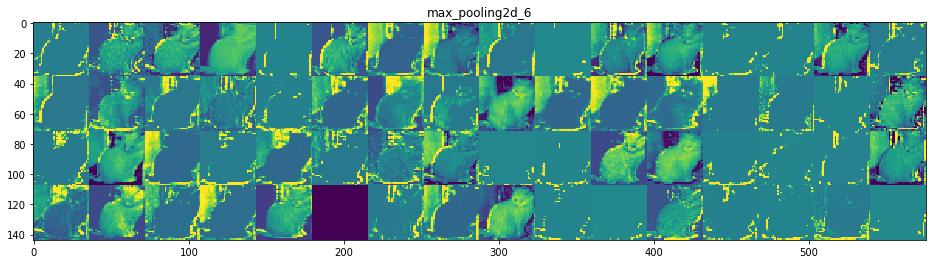

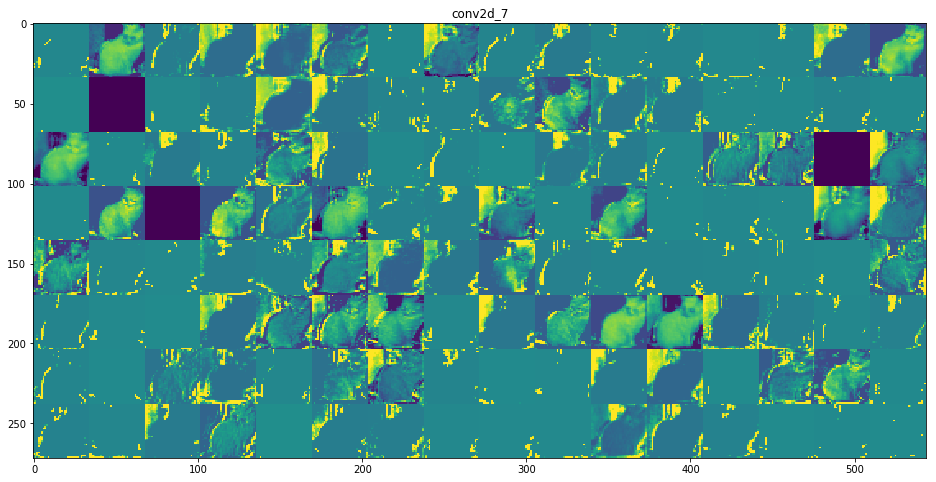

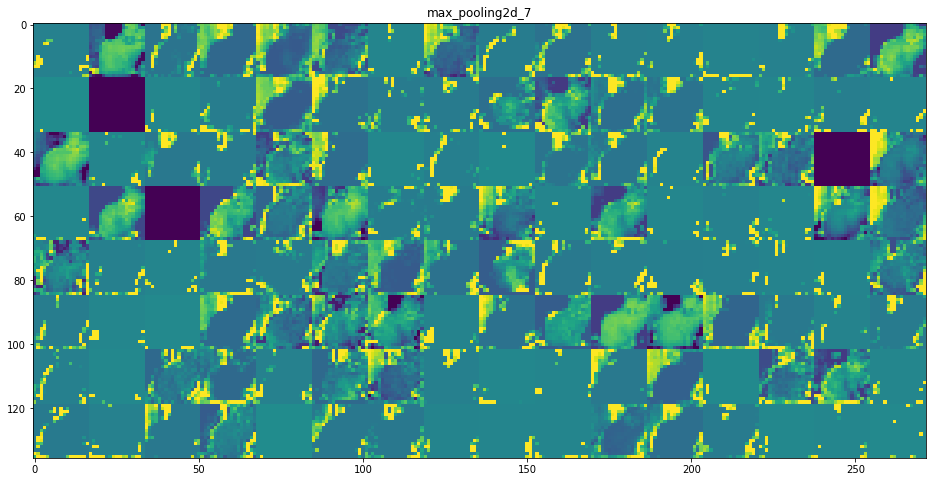

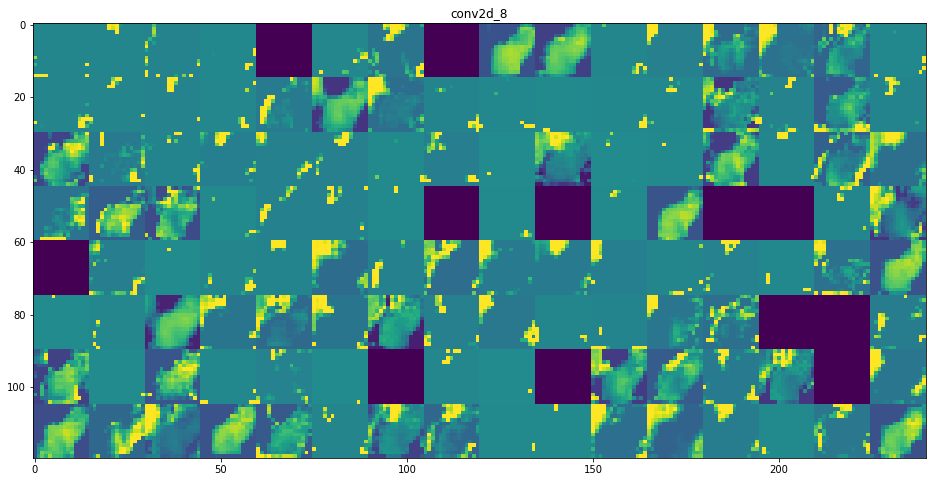

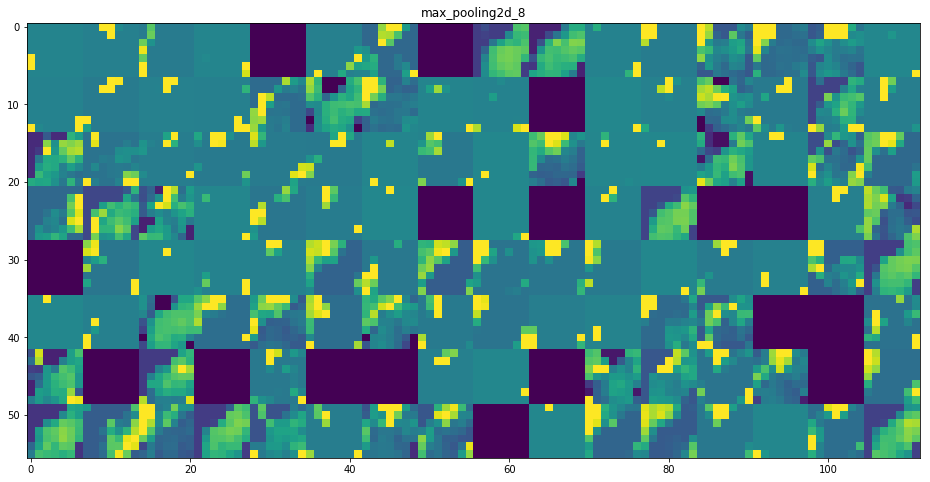

In [0]:
#　　再実行に必要な部分だけ抜粋

# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

## 4-2)フィルタの可視化
 * テキストの記述がわかりにくかったので、以下自分の解釈で記述。  
 * 手法としては、意図的にフィルタが応答するInputデータを勾配降下法で探しだす手順になる。Backpropagationで重みを訂正していく時と一緒。  
 
  * 空のデータを畳み込み層に入力する。
  * 出力結果を確認し、フィルタの応答が最大になる出力結果となるよう入力データを修正。
    * "特定の畳み込み層で特定のフィルタの値を最大化する損失化関数を組み立てる"はこのこと。
  * 上記を繰り返す。

### 可視化の準備

In [0]:
from keras.applications import VGG16
from keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
# 損失関数の定義
loss = K.mean(layer_output[:, :, :, filter_index])

W0822 12:19:15.758385 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0822 12:19:15.812771 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0822 12:19:15.823693 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0822 12:19:15.872833 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



58892288/58889256 [==============================] - 2s 0us/step


W0822 12:19:18.903690 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0822 12:19:18.905254 140610929600384 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



In [0]:
# gradientsから最初のテンソルだけを保持する
grads = K.gradients(loss, model.input)[0]
# 0除算回避
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [0]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [0]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [0]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [0]:
# 上記の流れを関数化
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

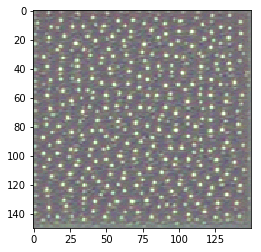

In [0]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

### 全フィルタの可視化

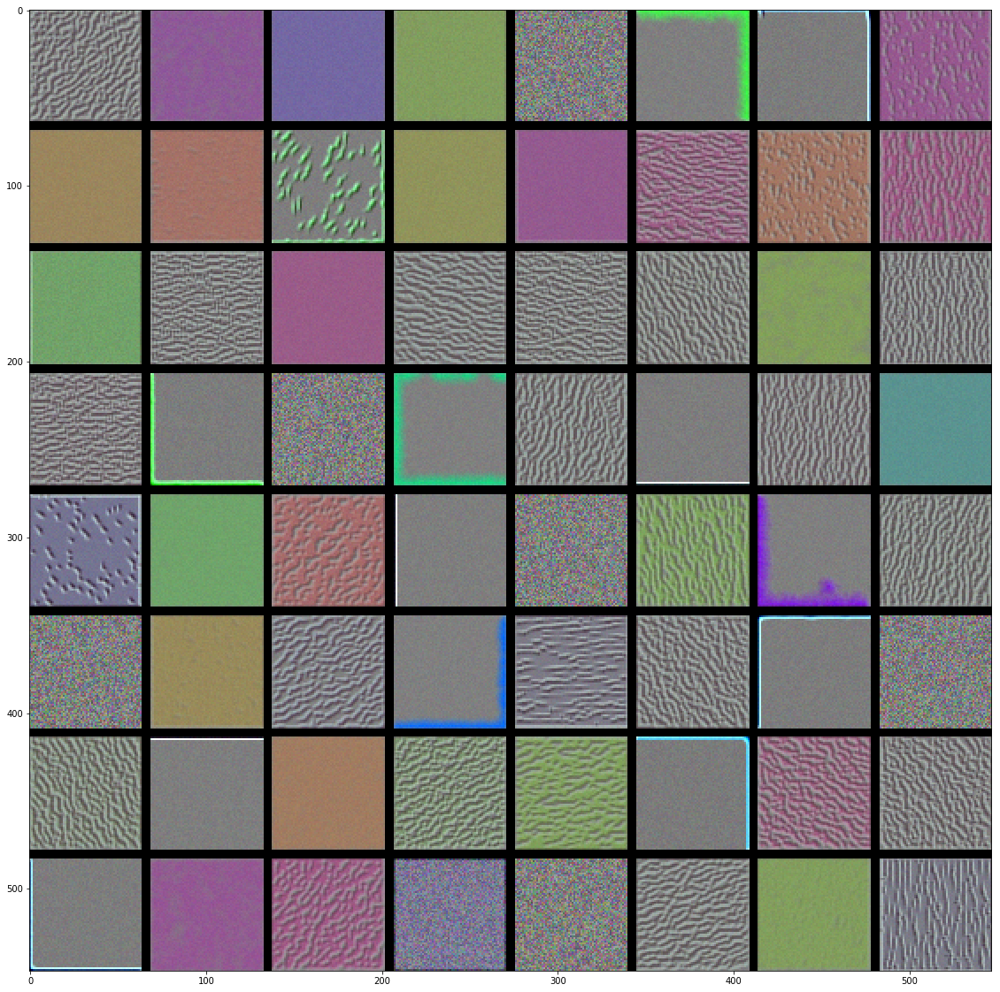

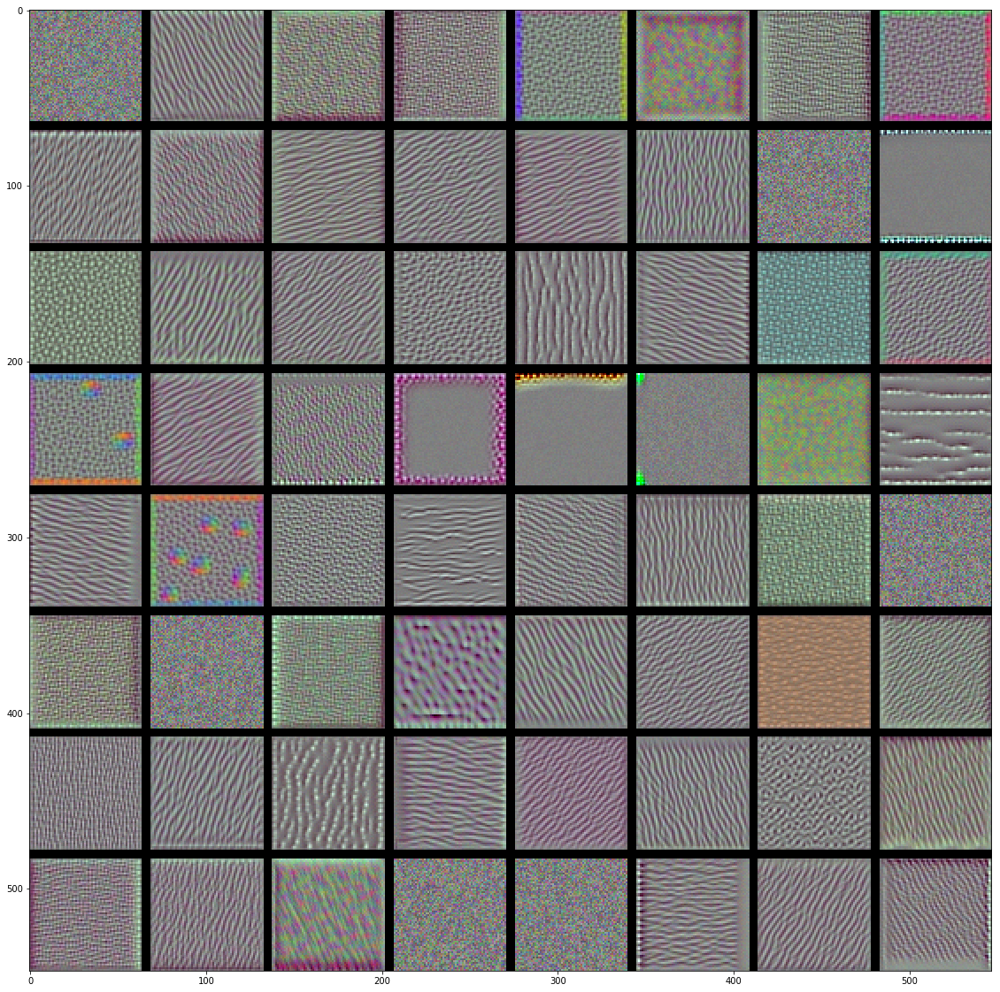

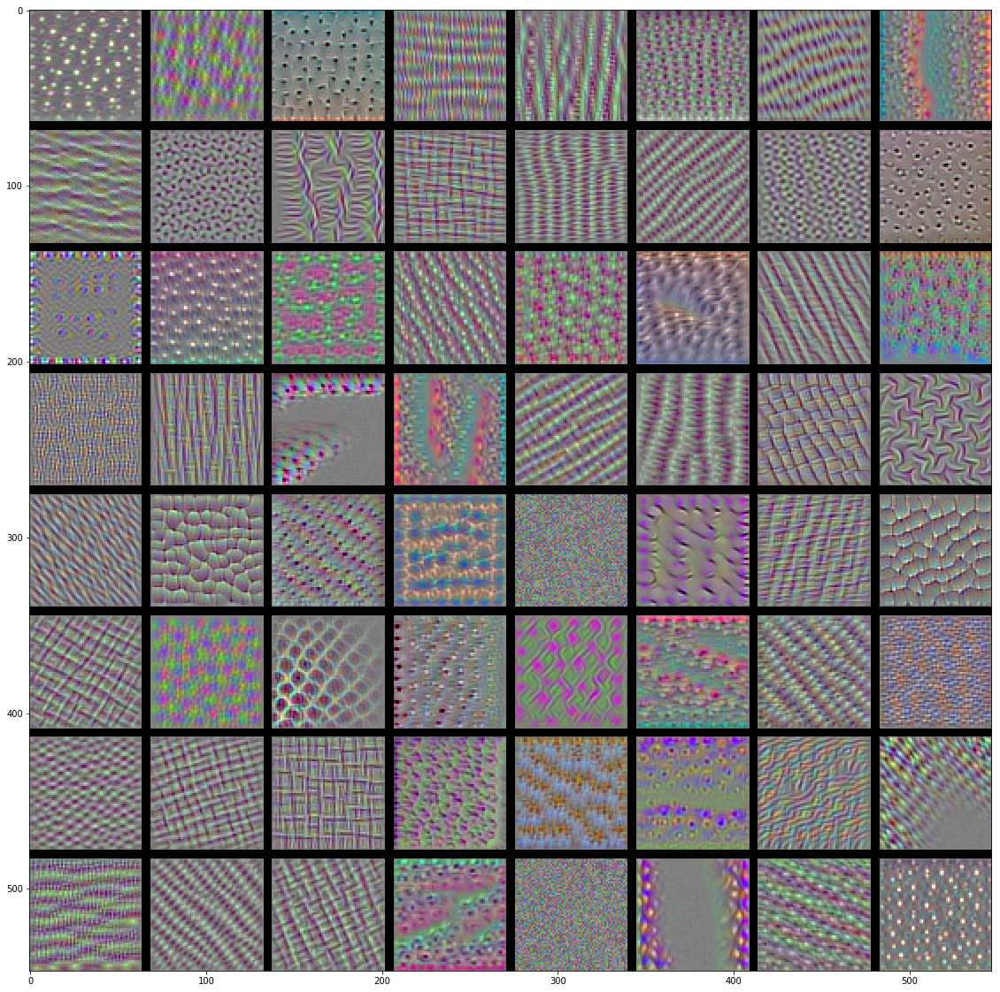

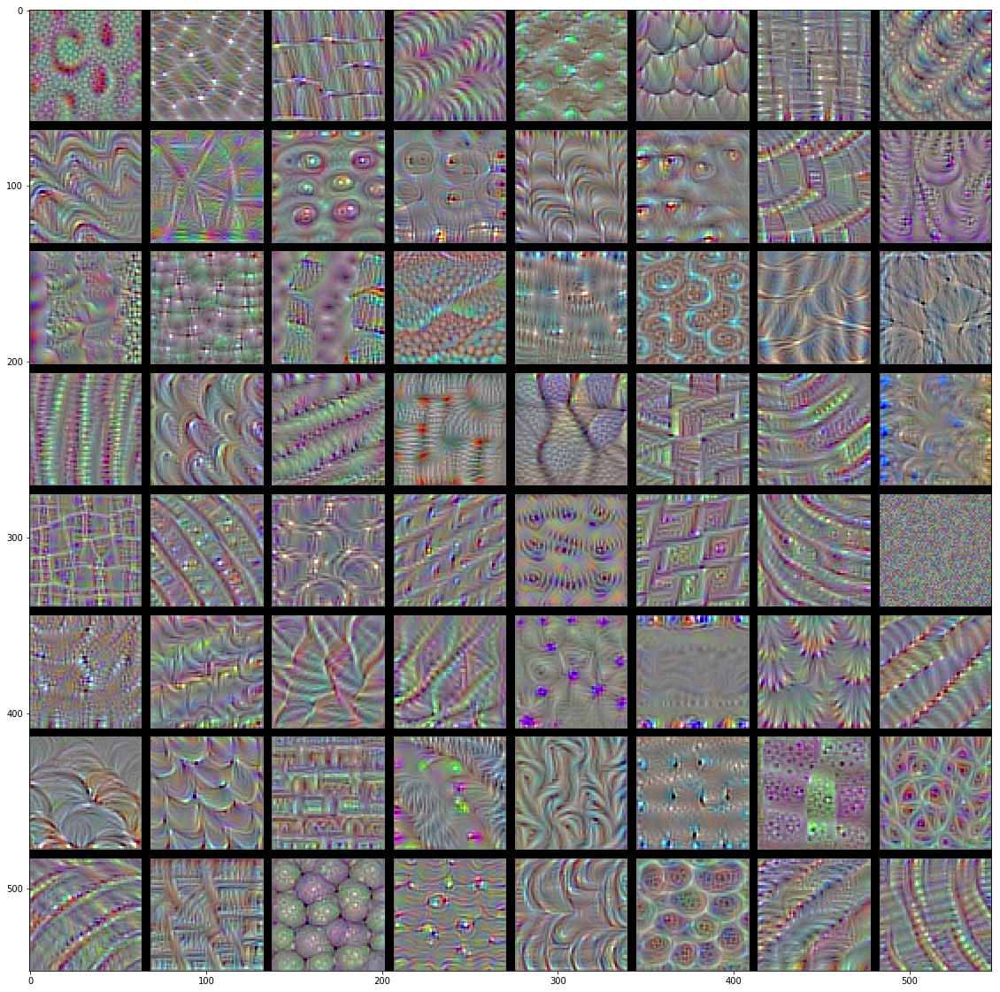

In [0]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype = int)

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

## 4-3)特徴量マップ
 * CAM(Class Activation Map)の表示

In [0]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# Note that we are including the densely-connected classifier on top;
# all previous times, we were discarding it.
model = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 12s 0us/step



Commons license):

![elephants](https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg)

### VGG-16で象の画像を分類

In [0]:
# 画像データの取得
! wget https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg -P ./c_c_img
# img_pathに指定
img_path = './c_c_img/creative_commons_elephant.jpg'

--2019-08-22 12:20:27--  https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.227.163
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.227.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 190269 (186K) [image/jpeg]
Saving to: ‘./c_c_img/creative_commons_elephant.jpg’

creative_commons_el 100%[===================>] 185.81K   981KB/s    in 0.2s    

2019-08-22 12:20:28 (981 KB/s) - ‘./c_c_img/creative_commons_elephant.jpg’ saved [190269/190269]



In [0]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# The local path to our target image
#img_path = '/Users/fchollet/Downloads/creative_commons_elephant.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

**予測結果**

In [0]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])
# カテゴリ
np.argmax(preds[0])

40960/35363 [==================================] - 0s 0us/step
Predicted: [('n02504458', 'African_elephant', 0.9094213), ('n01871265', 'tusker', 0.08618258), ('n02504013', 'Indian_elephant', 0.004354576)]


386

### Grad-CAMの実行

In [0]:
# This is the "african elephant" entry in the prediction vector
african_elephant_output = model.output[:, 386]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block3_conv3')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

IndexError: ignored

ヒートマップの正規化と表示


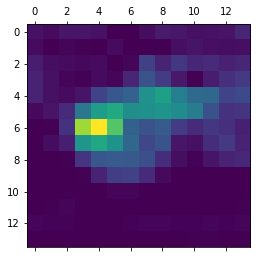

In [0]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

### テスト画像へのマッピング(with OpenCV)

In [0]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
#@Francois
#cv2.imwrite('/Users/fchollet/Downloads/elephant_cam.jpg', superimposed_img)

cv2.imwrite('./c_c_img/elephant_cam.jpg', superimposed_img)

True

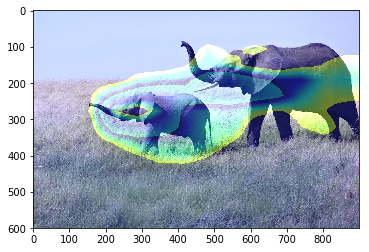

In [0]:
from PIL import Image

#画像の読み込み
im = Image.open("./c_c_img/elephant_cam.jpg")

#画像をarrayに変換
im_list = np.asarray(im)
#貼り付け
plt.imshow(im_list)
#表示
plt.show()